**NOTE** : requires local installation of the [YOLOv5](https://github.com/ultralytics/yolov5) repo.  
The yolo CLI is used, not Python

## 1. Airbus

Long output depending on the epochs value

In [ ]:
!python3 algorithms/yolov5/train.py --img 512 --cfg yolov5x.yaml --hyp algorithms/yolov5/data/hyps/hyp.scratch-low.yaml --batch 120 --epochs 200 --data data/airbus/dataset.yaml --weights yolov5x.pt --workers 24 --name yolov5 --device 0,1,2

In [ ]:
!python3 algorithms/yolov5/detect.py --source unseen/ --weights algorithms/yolov5/runs/train/yolov57/weights/best.pt --conf 0.1 --name detection

## 2. HRPlanesv2

In [ ]:
!nohup python3 algorithms/yolov5/train.py --img 512 --cfg yolov5x.yaml --hyp algorithms/yolov5/data/hyps/hyp.scratch-low.yaml --batch 20 --epochs 500 --data data/HRPlanesv2/dataset.yaml --weights yolov5x.pt --workers 8 --name yolov5 --device 2 > logv5_500.out

Results in [algorithms/yolov5/runs/train/yolov57](algorithms/yolov5/runs/train/yolov57) and logv5_500.out  

In [12]:
!python3 algorithms/yolov5/detect.py --weights algorithms/yolov5/runs/train/yolov57/weights/best.pt --source data/unseen  --save-txt --save-conf  

detect: weights=['algorithms/yolov5/runs/train/yolov57/weights/best.pt'], source=data/unseen, data=algorithms/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=algorithms/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-240-g84ec8b5 Python-3.9.18 torch-2.1.1+cu121 CUDA:0 (NVIDIA RTX A6000, 48677MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/10 /home/arnaud/projects/benchmark_aircraft/data/unseen/003_set2.jpg: 384x640 10 Aircrafts, 86.1ms
image 2/10 /home/arnaud/projects/benchmark_aircraft/data/unseen/022f91f0-1434-401f-a11b-e315b7068100.jpg: 640x640 25 Aircrafts, 10.9ms
image 3/10 /home/arnaud/proje

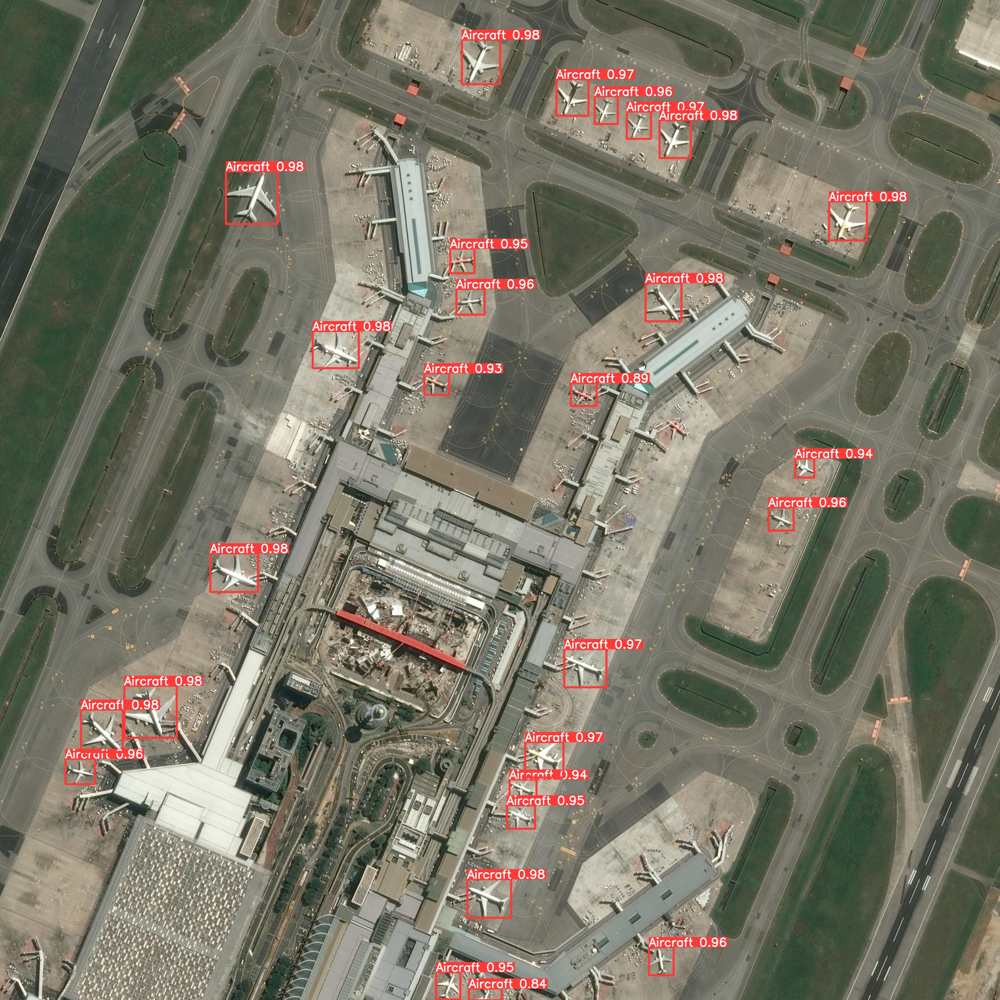

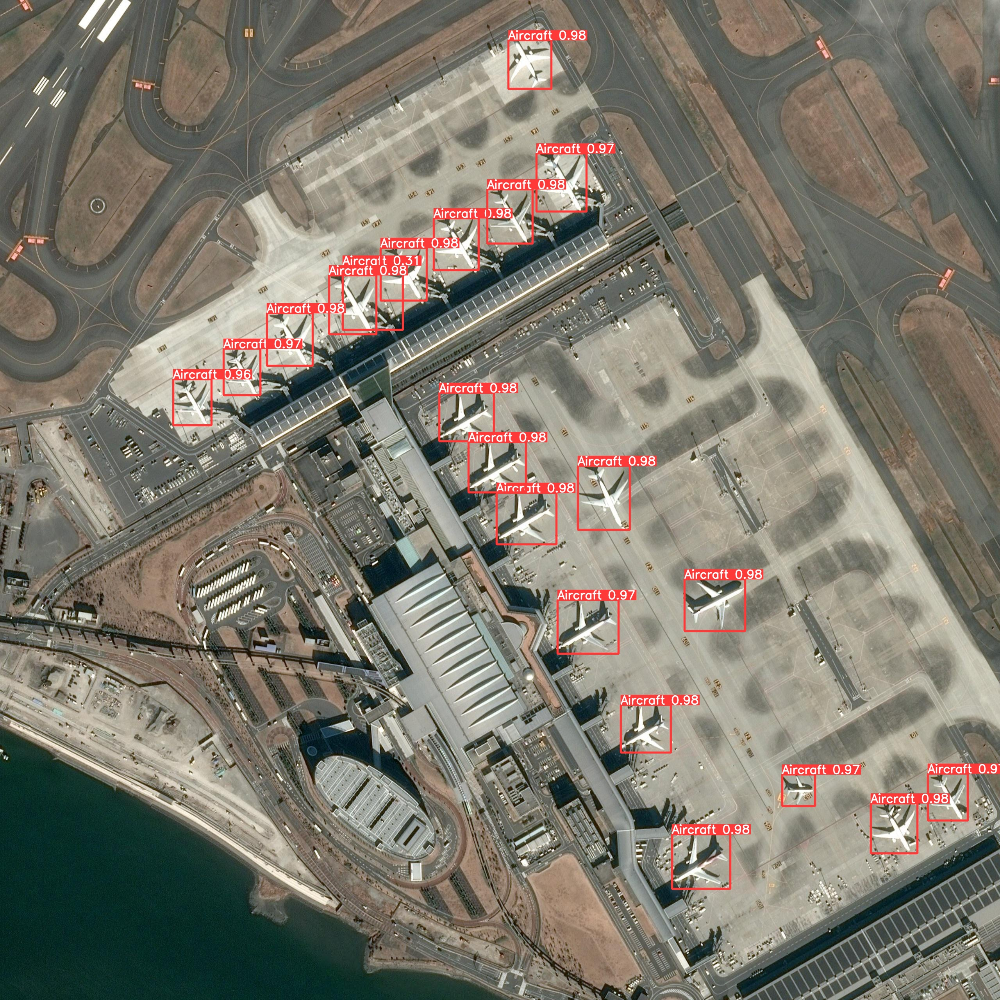

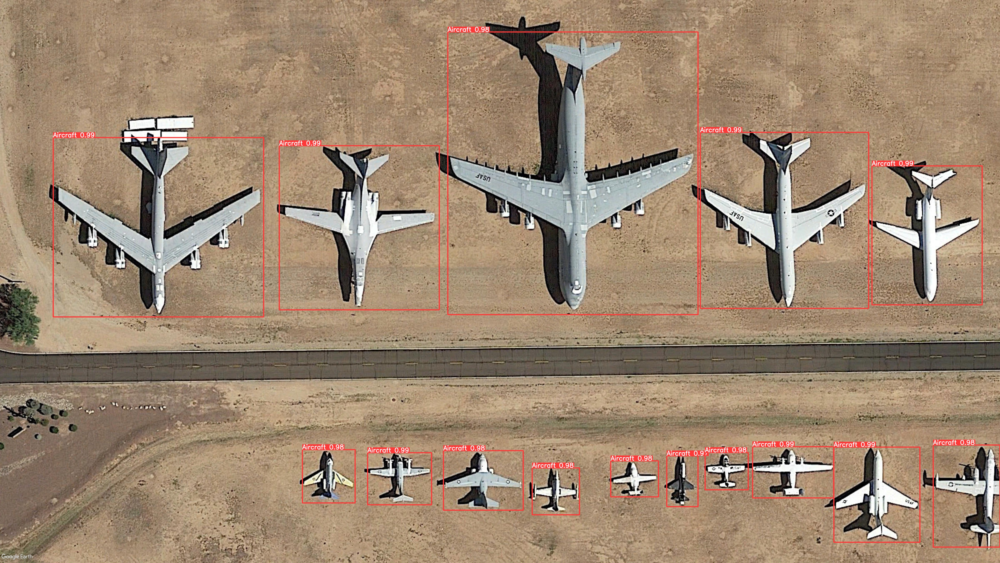

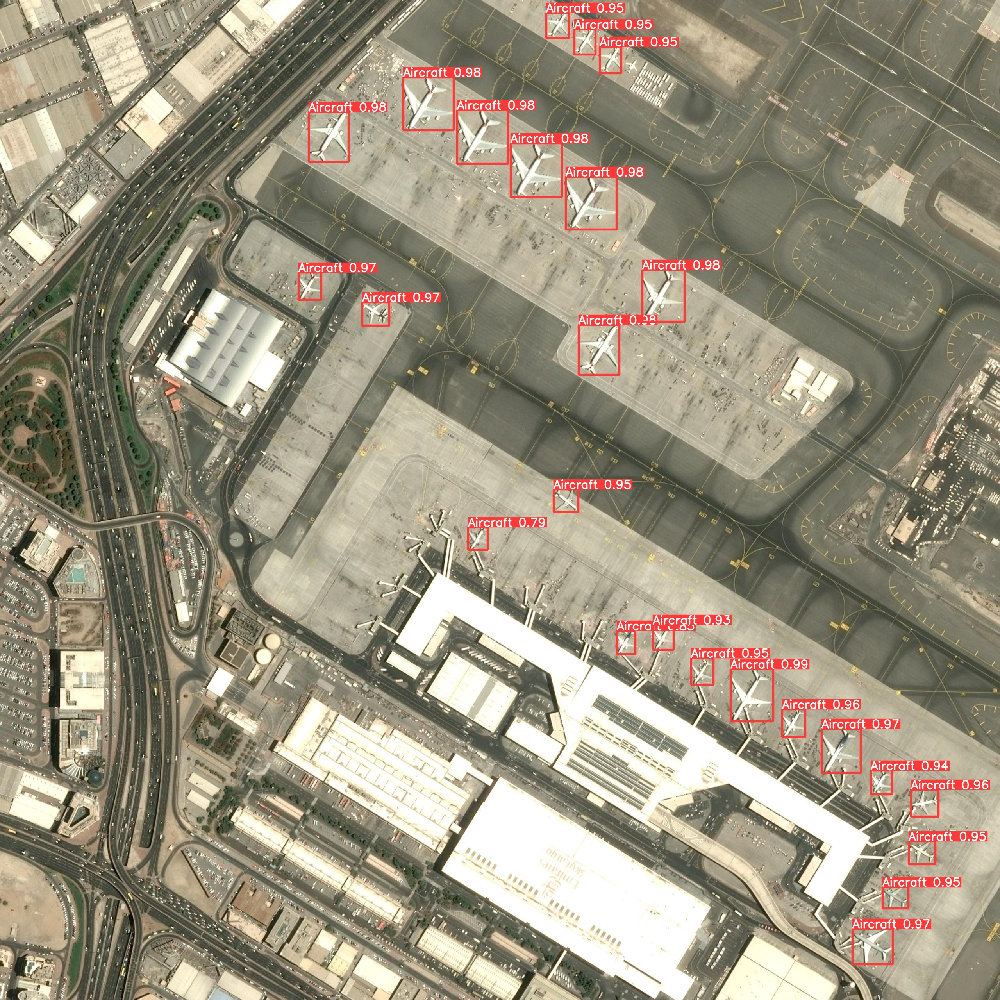

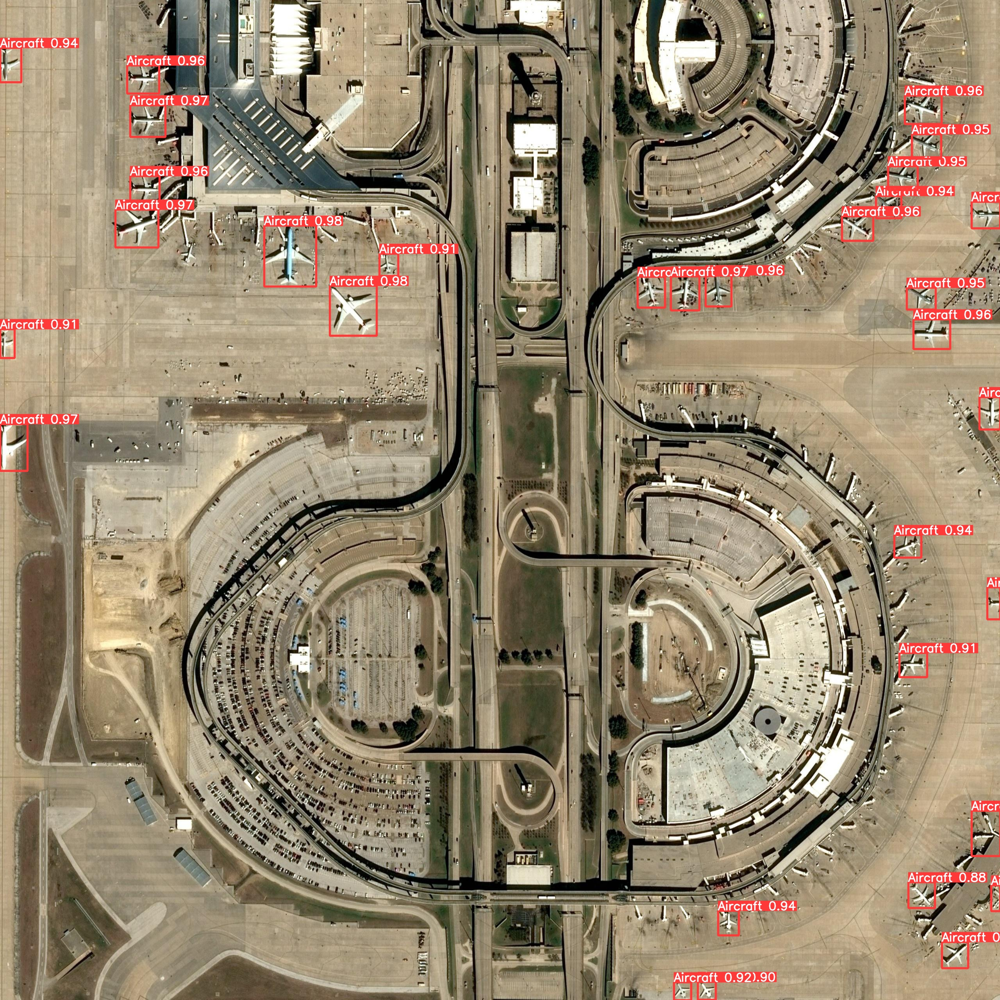

In [13]:
from IPython.display import Image, display
from glob import glob

for image_path in glob('./algorithms/yolov5/runs/detect/exp/*.jpg')[:5]:
      # Change width for larger display
      display(Image(filename=image_path, width=256))

In [10]:
!python3 algorithms/yolov5/detect.py -h

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--data DATA] [--imgsz IMGSZ [IMGSZ ...]]
                 [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img]
                 [--save-txt] [--save-csv] [--save-conf] [--save-crop]
                 [--nosave] [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half] [--dnn]
                 [--vid-stride VID_STRIDE]

optional arguments:
  -h, --help            show this help message and exit
  --weights WEIGHTS [WEIGHTS ...]
                        model path or triton URL
  --source SOURCE       file/dir/URL/glob/screen/0(webcam)
  --data DATA           (optional) dataset.yaml path
  --imgsz IMGSZ [IMGSZ ...], --img IMGSZ [IMGSZ ...

## 3. Video inference

In [ ]:
!python3 algorithms/yolov5/detect.py --weights algorithms/yolov5/runs/train/yolov57/weights/best.pt --source data/unseen/Barcelona_airport.mp4